The following is a program designed as a secure access and identity verification, using face recognition Python modules developed by OpenCV (Open Source Computer Vision Library). It has 4 parts. 
 - The first two parts are designed to demonstrate the inner workings of the program: the common points between all faces of a particular person in our database. 
 - The third part is the test in which a numerical value is assigned to each person's common keypoints, and the identity of the person wishing to access our secure system is compared to the identity-verified person. 
- The fourth part is the is the part that shows the results.

Part
The following part of the program is the first training part.
It is designed to demonstrate the program implementation by showing the faces and the common keypoints between two different faces.

In this part, we make use of OpenCV (Open Source Computer Vision Library). This is an open-source library that includes several hundreds of computer vision algorithms.

Step 1: In this part, we load the relevant modules from cv2.
Step 2: In the training part, we will select a folder from our database and put the path to it under "image_dir",
        and save them as a list of paths in the "image_files" variable.
Step 3: At this stage, we use 2 for loops with the variables "i" and "j" to compare each face in our directory to every
        other one, and find common keypoints.
Step 3.1: In this step, we print the results to the console using "matplotlib", a Python library used for visualization.

This is a scenario in which Andrew is trying to enter Aiden's secure system.


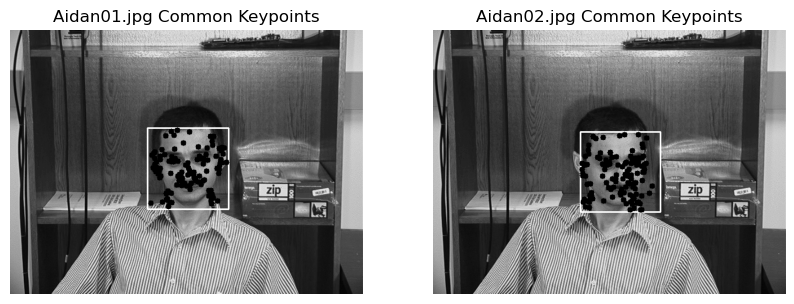

Number of common keypoints in Aidan01.jpg : 135
Number of common keypoints in Aidan02.jpg : 140


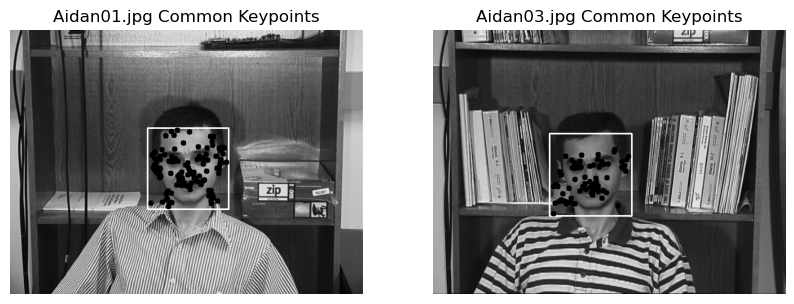

Number of common keypoints in Aidan01.jpg : 135
Number of common keypoints in Aidan03.jpg : 81


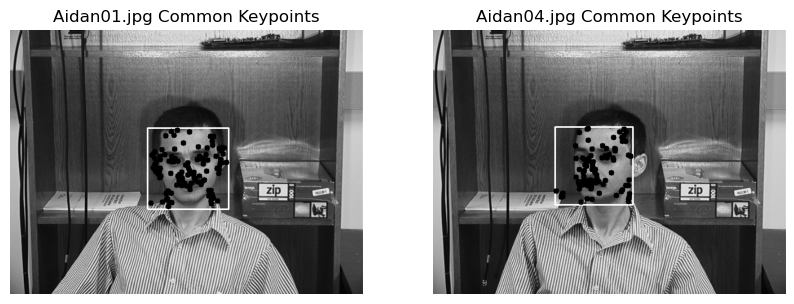

Number of common keypoints in Aidan01.jpg : 135
Number of common keypoints in Aidan04.jpg : 92


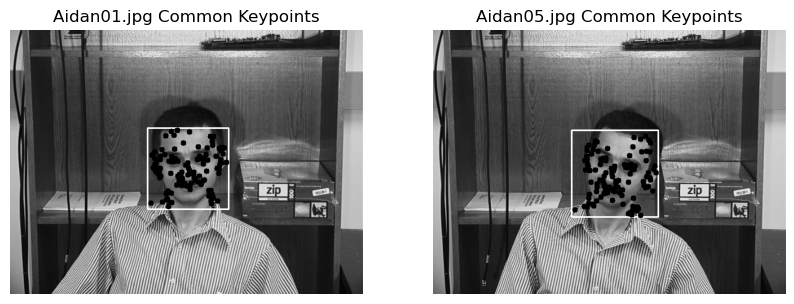

Number of common keypoints in Aidan01.jpg : 135
Number of common keypoints in Aidan05.jpg : 136


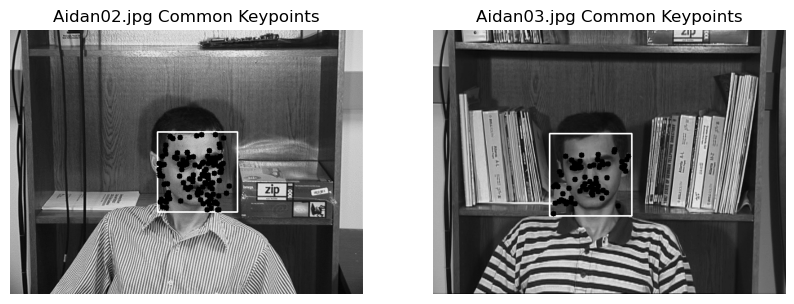

Number of common keypoints in Aidan02.jpg : 140
Number of common keypoints in Aidan03.jpg : 81


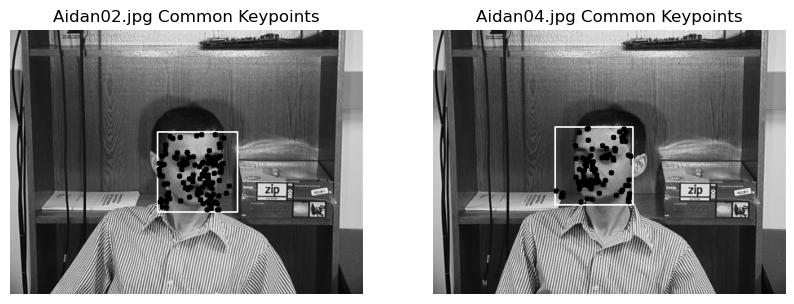

Number of common keypoints in Aidan02.jpg : 140
Number of common keypoints in Aidan04.jpg : 92


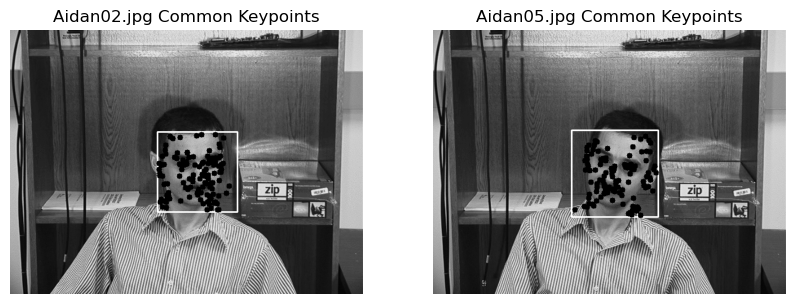

Number of common keypoints in Aidan02.jpg : 140
Number of common keypoints in Aidan05.jpg : 136


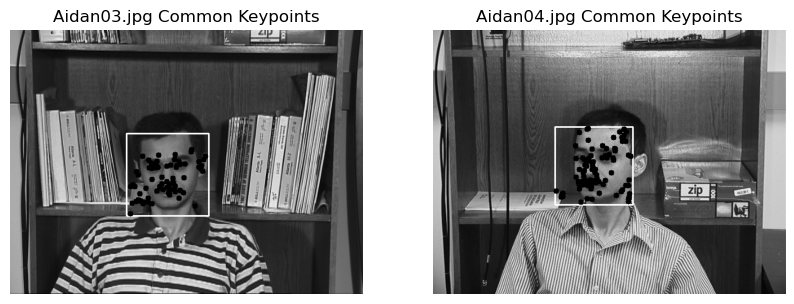

Number of common keypoints in Aidan03.jpg : 81
Number of common keypoints in Aidan04.jpg : 92


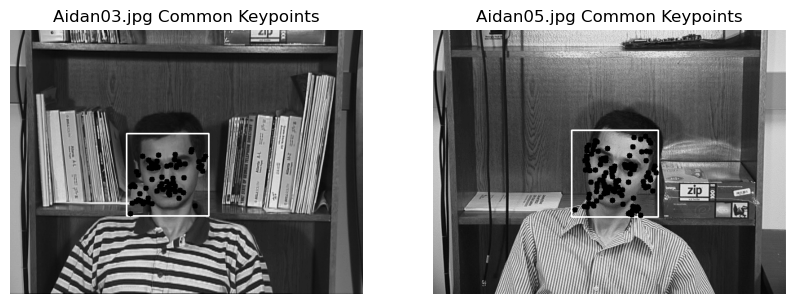

Number of common keypoints in Aidan03.jpg : 81
Number of common keypoints in Aidan05.jpg : 136


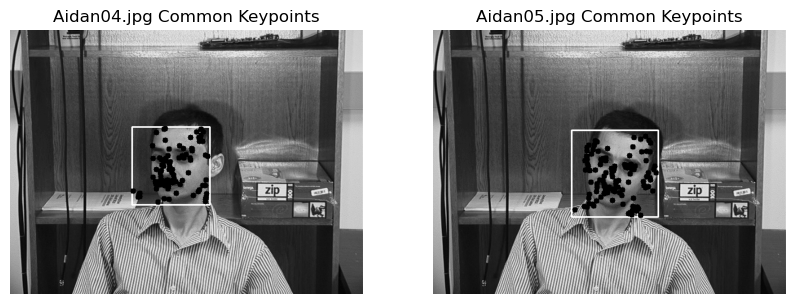

Number of common keypoints in Aidan04.jpg : 92
Number of common keypoints in Aidan05.jpg : 136


In [1]:
### training 1 ###
# This part is for demostraiting the program by showing the faces and the commen key points

# Sources
# https://docs.opencv.org/4.x/dc/da5/tutorial_py_drawing_functions.html
# Srouces
# https://docs.opencv.org/3.4/d5/d6f/tutorial_feature_flann_matcher.html

# AIGS1010 - Camputer vision, week 6 demo:
    # https://loyalistcollege.instructure.com/courses/10557/pages/demo-resources?module_item_id=619758
# https://www.geeksforgeeks.org/python-grayscaling-of-images-using-opencv/


import cv2
import os
from matplotlib import pyplot as plt

# step 1:
# Load the pre-trained face detector
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

# Initialize SIFT
sift = cv2.SIFT_create()


##################################################################################
# step 2:
# Path to the directory containing the images to be used for trauning and testing

image_dir = r"C:\Users\Ilan\Desktop\Face recognition\gt_db\gt_database 1\gt_database 1\gt_db\Aidan"


# Get a list of all image filenames in the directory 
image_files = [file for file in os.listdir(image_dir) if file.endswith('.jpg')]

#################################################################################
#step 3:
# https://www.geeksforgeeks.org/python-grayscaling-of-images-using-opencv/

for i in range(len(image_files)): # all the images in the directory
    for j in range(i+1, len(image_files)): # i and j will be used to compair the pictures to each other
        # Read the images
        img1 = cv2.imread(os.path.join(image_dir, image_files[i]), cv2.IMREAD_GRAYSCALE)
        img2 = cv2.imread(os.path.join(image_dir, image_files[j]), cv2.IMREAD_GRAYSCALE)
        
        # Detect the faces in all of the pictures
        faces1 = face_cascade.detectMultiScale(img1, scaleFactor=1.1, minNeighbors=5)
        faces2 = face_cascade.detectMultiScale(img2, scaleFactor=1.1, minNeighbors=5)
        
        # Initialize lists to store common keypoints
        common_kp1 = []
        common_kp2 = []
        
        # https://www.geeksforgeeks.org/python-grayscaling-of-images-using-opencv/
        # Extract keypoints and descriptors only within the detected faces
        for (x, y, w, h) in faces1:
            face_roi = img1[y:y+h, x:x+w]
            kp1, des1 = sift.detectAndCompute(face_roi, None)
            common_kp1.extend(kp1)
            cv2.rectangle(img1, (x, y), (x+w, y+h), (255, 0, 0), 2)
            for kp in common_kp1:
                cv2.circle(img1, (int(kp.pt[0]) + x, int(kp.pt[1]) + y), 5, (0, 255, 0), -1)
        
        for (x, y, w, h) in faces2:
            face_roi = img2[y:y+h, x:x+w]
            kp2, des2 = sift.detectAndCompute(face_roi, None)
            common_kp2.extend(kp2)
            cv2.rectangle(img2, (x, y), (x+w, y+h), (255, 0, 0), 2)
            for kp in common_kp2:
                cv2.circle(img2, (int(kp.pt[0]) + x, int(kp.pt[1]) + y), 5, (0, 255, 0), -1)

#################################################################################
# step 3.1
        # Display the images with faces and common keypoints
        fig, axes = plt.subplots(1, 2, figsize=(10, 5))
        axes[0].imshow(img1, cmap='gray')
        axes[0].set_title(f'{image_files[i]} Common Keypoints')
        axes[0].axis('off')

        axes[1].imshow(img2, cmap='gray')
        axes[1].set_title(f'{image_files[j]} Common Keypoints')
        axes[1].axis('off')

        plt.show()

        # Compare the number of common keypoints in both faces
        print("Number of common keypoints in", image_files[i], ":", len(common_kp1))
        print("Number of common keypoints in", image_files[j], ":", len(common_kp2))


This is the second training part.
In this part, we go through the same process as in the first training part and then calculate a numerical value for the similarity of all faces from our training directory to all of the other faces in the directory. This gives us an average of all common keypoints in the training faces.
Mathematically, it is:

sum((x/y)+(y/x))/n

where:
x and y are represents the common keypoints for every pair of faces,
n is the number of faces.

The first lines of code are identical to parts 1 and 2 from the first training part.
The last part of the code is a calculator that will extract the value we get for the real person.


In [2]:
### Training 2 ###
# A calculator for the average ratio of common points between all training faces

import cv2
import os
import numpy as np

# Load the pre-trained face detector
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

# Initialize SIFT
sift = cv2.SIFT_create()

###########
# Path to the directory containing the images
image_dir = r"C:\Users\Ilan\Desktop\Face recognition\gt_db\gt_database 1\gt_database 1\gt_db\Aidan"
###########

# Get a list of all image filenames in the directory
image_files = [file for file in os.listdir(image_dir) if file.endswith('.jpg')]

# Initialize a list to store the average number of common keypoints for each pair of images
average_common_keypoints = []

# Iterate over each pair of images
for i in range(len(image_files)):
    for j in range(i+1, len(image_files)):
        # Read the images
        img1 = cv2.imread(os.path.join(image_dir, image_files[i]), cv2.IMREAD_GRAYSCALE)
        img2 = cv2.imread(os.path.join(image_dir, image_files[j]), cv2.IMREAD_GRAYSCALE)
        
        # Detect faces in the images
        faces1 = face_cascade.detectMultiScale(img1, scaleFactor=1.15, minNeighbors=5)
        faces2 = face_cascade.detectMultiScale(img2, scaleFactor=1.15, minNeighbors=5)
        
        # Initialize lists to store common keypoints
        common_kp1 = []
        common_kp2 = []
        
        # Extract keypoints and descriptors only within the detected faces
        for (x, y, w, h) in faces1:
            face_roi = img1[y:y+h, x:x+w]
            kp1, des1 = sift.detectAndCompute(face_roi, None)
            common_kp1.extend(kp1)
        
        for (x, y, w, h) in faces2:
            face_roi = img2[y:y+h, x:x+w]
            kp2, des2 = sift.detectAndCompute(face_roi, None)
            common_kp2.extend(kp2)
        
        # Calculate the average number of common keypoints for this pair of images
        average_keypoints = ((len(common_kp1) / len(common_kp2)) + (len(common_kp2) / len(common_kp1))) / 2
        average_common_keypoints.append(average_keypoints)

# Calculate the average value of each pair of pictures divided by the other
average_value_real = sum(average_common_keypoints) / len(average_common_keypoints)
print("Average value of common keypoints:", average_value_real)


Average value of common keypoints: 1.0535247454464323


This is the testing part. This part simulates a scenario in which a person who wasn't tested wants to enter. 
To achieve this, we choose pictures of faces who do not belong to the person we had trained the program on.
Like in the training phase, we compare all common keypoints between the 'real' person and the one wishing to access.
The result of this computation is a larger value than in the training, and access is denied.


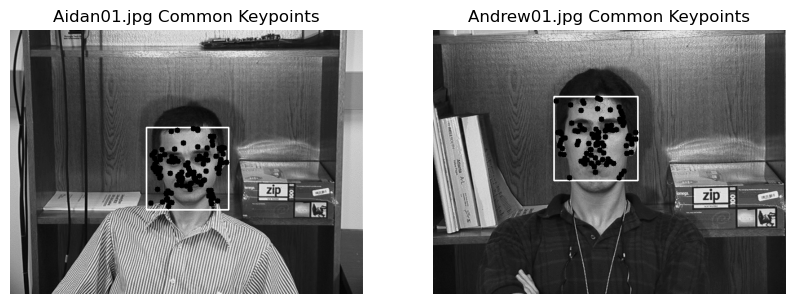

Comparison between Aidan01.jpg and Andrew01.jpg:
Average value of common keypoints: 1.0293850454227813
-----------------------------------------


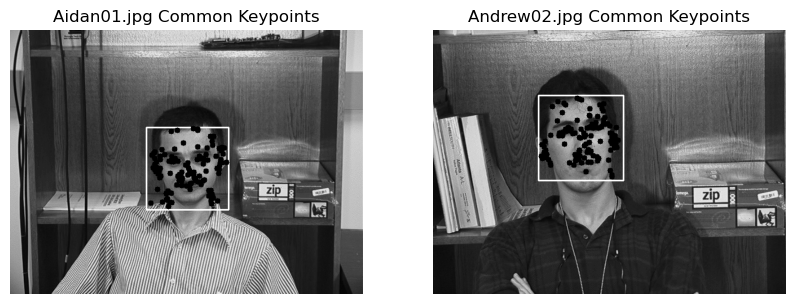

Comparison between Aidan01.jpg and Andrew02.jpg:
Average value of common keypoints: 1.0002525252525252
-----------------------------------------


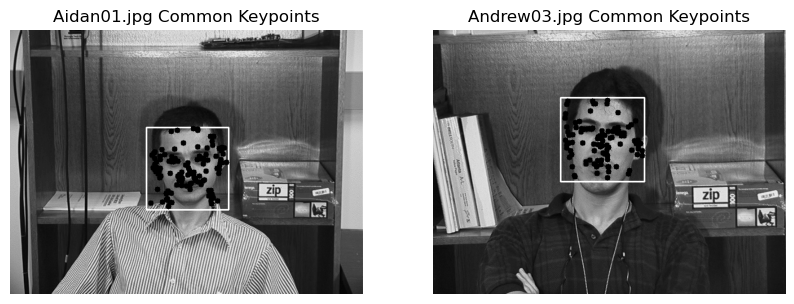

Comparison between Aidan01.jpg and Andrew03.jpg:
Average value of common keypoints: 1.0128824476650564
-----------------------------------------


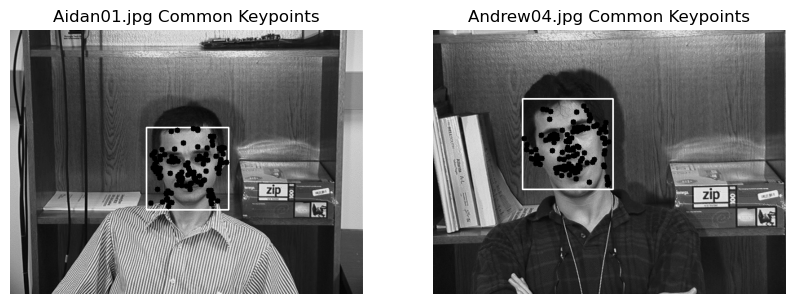

Comparison between Aidan01.jpg and Andrew04.jpg:
Average value of common keypoints: 1.0002415458937197
-----------------------------------------


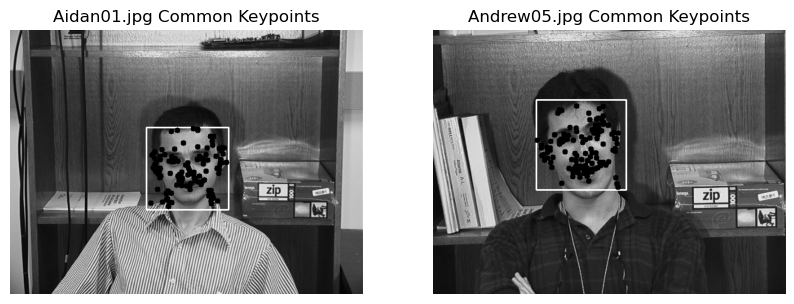

Comparison between Aidan01.jpg and Andrew05.jpg:
Average value of common keypoints: 1.0006613756613756
-----------------------------------------


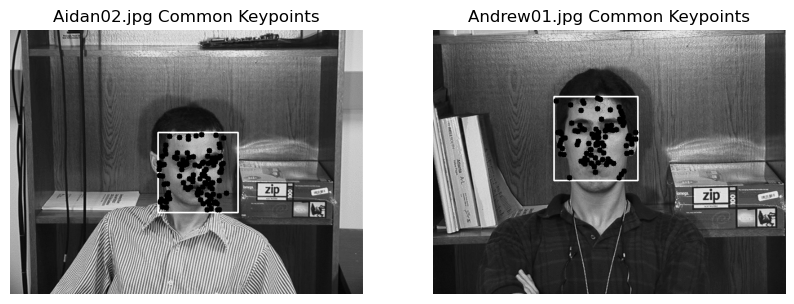

Comparison between Aidan02.jpg and Andrew01.jpg:
Average value of common keypoints: 1.0241566609491137
-----------------------------------------


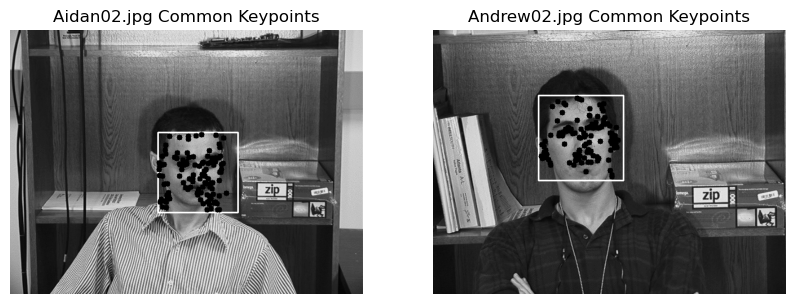

Comparison between Aidan02.jpg and Andrew02.jpg:
Average value of common keypoints: 1.0
-----------------------------------------


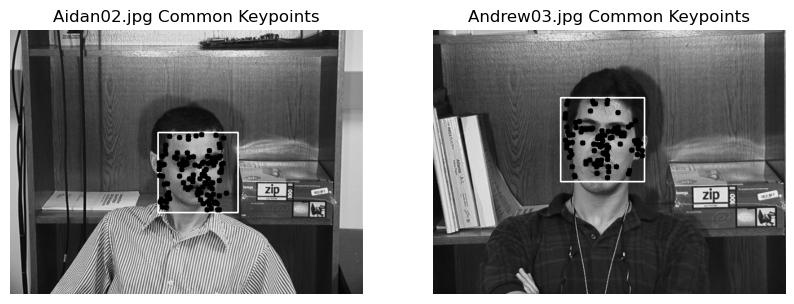

Comparison between Aidan02.jpg and Andrew03.jpg:
Average value of common keypoints: 1.0095191040843214
-----------------------------------------


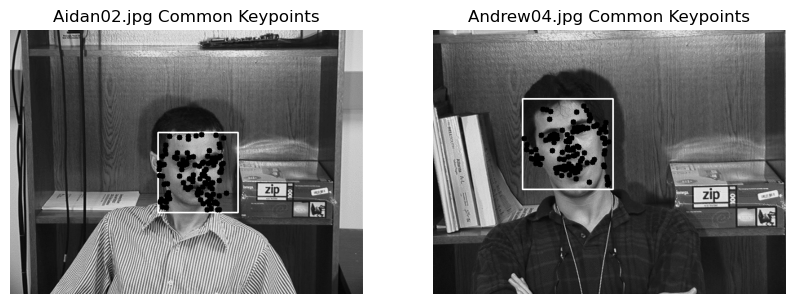

Comparison between Aidan02.jpg and Andrew04.jpg:
Average value of common keypoints: 1.0009881422924902
-----------------------------------------


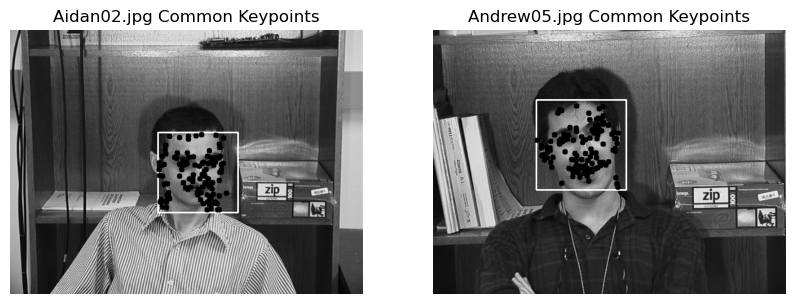

Comparison between Aidan02.jpg and Andrew05.jpg:
Average value of common keypoints: 1.0017316017316018
-----------------------------------------


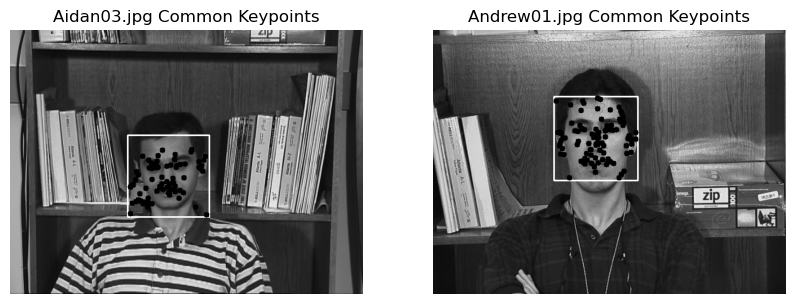

Comparison between Aidan03.jpg and Andrew01.jpg:
Average value of common keypoints: 1.030063650829734
-----------------------------------------


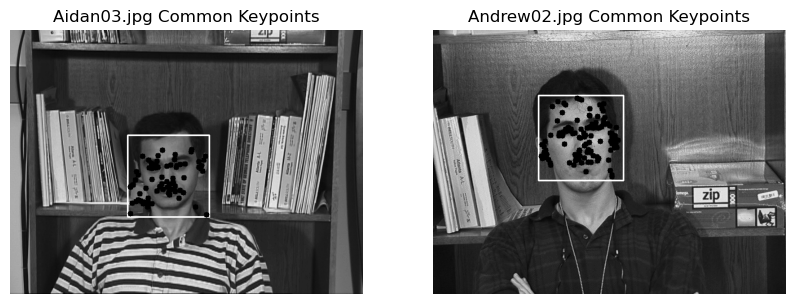

Comparison between Aidan03.jpg and Andrew02.jpg:
Average value of common keypoints: 1.1095746622855056
-----------------------------------------


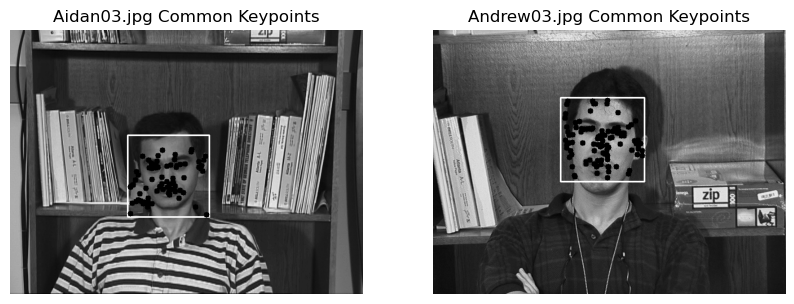

Comparison between Aidan03.jpg and Andrew03.jpg:
Average value of common keypoints: 1.0536406495547408
-----------------------------------------


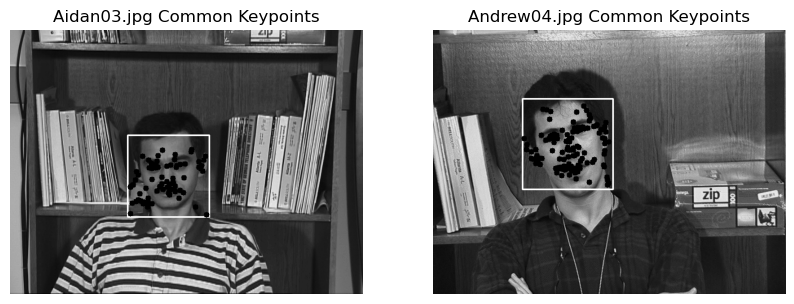

Comparison between Aidan03.jpg and Andrew04.jpg:
Average value of common keypoints: 1.1320499388859786
-----------------------------------------


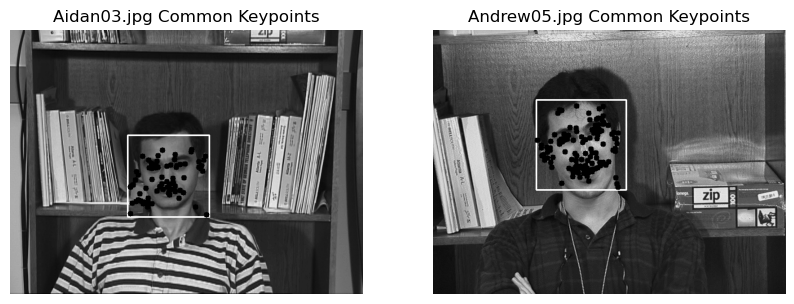

Comparison between Aidan03.jpg and Andrew05.jpg:
Average value of common keypoints: 1.1398020654044752
-----------------------------------------


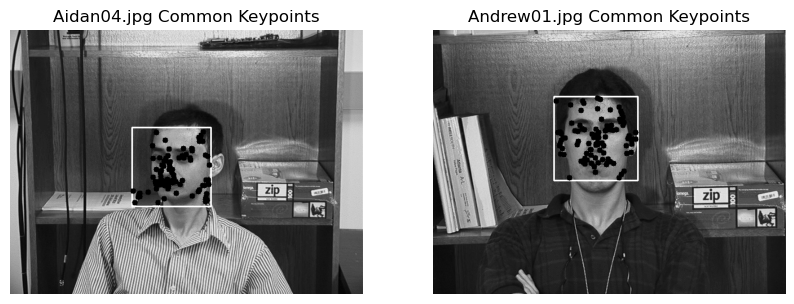

Comparison between Aidan04.jpg and Andrew01.jpg:
Average value of common keypoints: 1.0134171907756815
-----------------------------------------


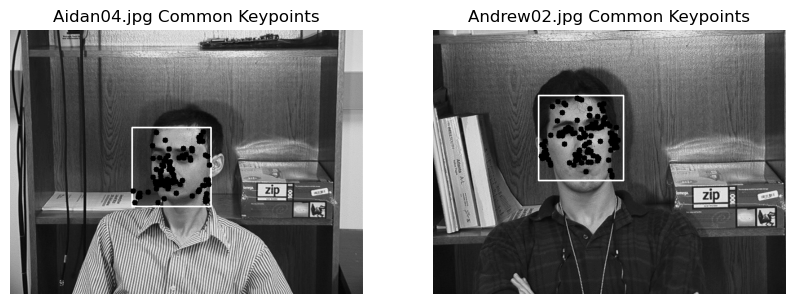

Comparison between Aidan04.jpg and Andrew02.jpg:
Average value of common keypoints: 1.0742424242424242
-----------------------------------------


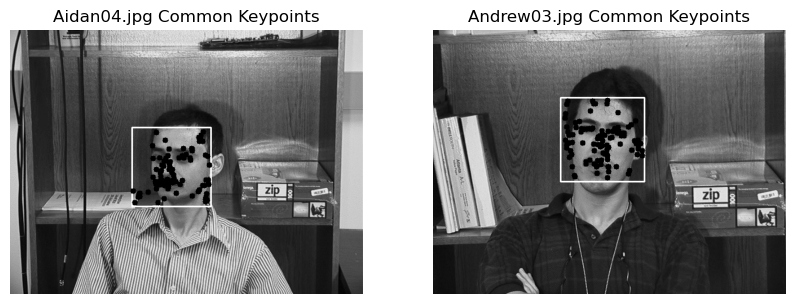

Comparison between Aidan04.jpg and Andrew03.jpg:
Average value of common keypoints: 1.0301932367149758
-----------------------------------------


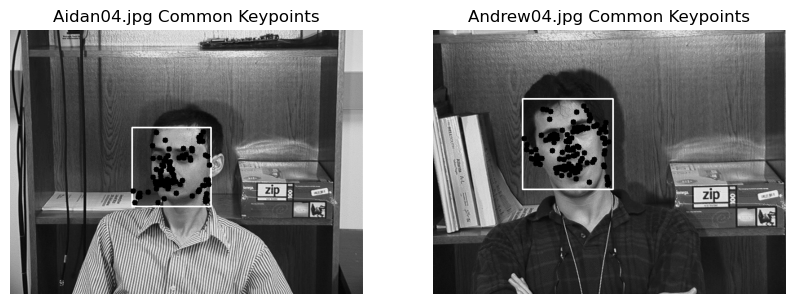

Comparison between Aidan04.jpg and Andrew04.jpg:
Average value of common keypoints: 1.0927536231884059
-----------------------------------------


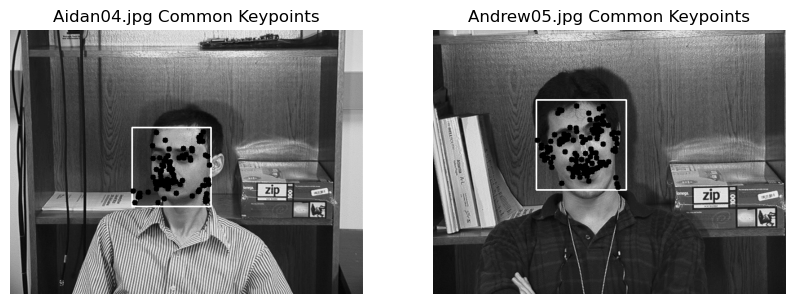

Comparison between Aidan04.jpg and Andrew05.jpg:
Average value of common keypoints: 1.0992063492063493
-----------------------------------------


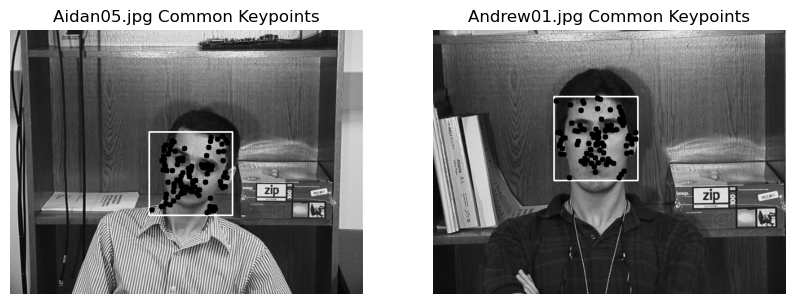

Comparison between Aidan05.jpg and Andrew01.jpg:
Average value of common keypoints: 1.013622641509434
-----------------------------------------


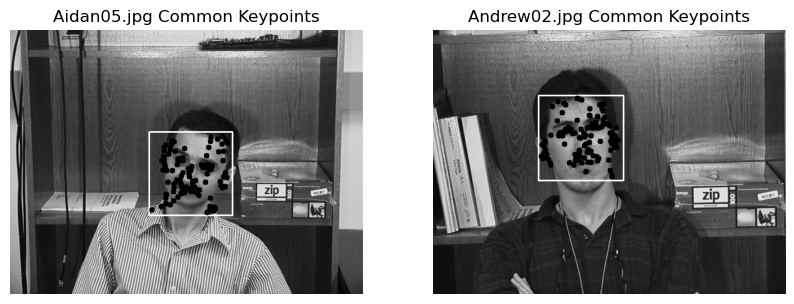

Comparison between Aidan05.jpg and Andrew02.jpg:
Average value of common keypoints: 1.0014848484848486
-----------------------------------------


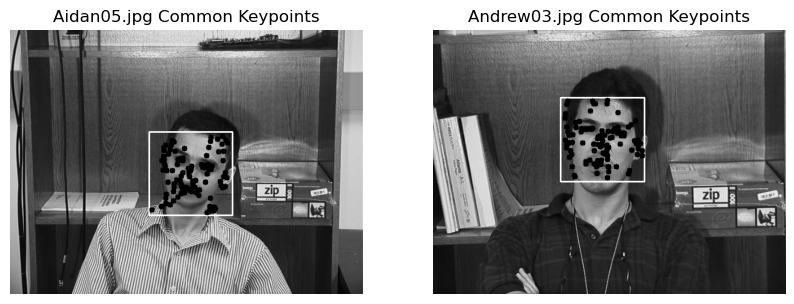

Comparison between Aidan05.jpg and Andrew03.jpg:
Average value of common keypoints: 1.0034782608695652
-----------------------------------------


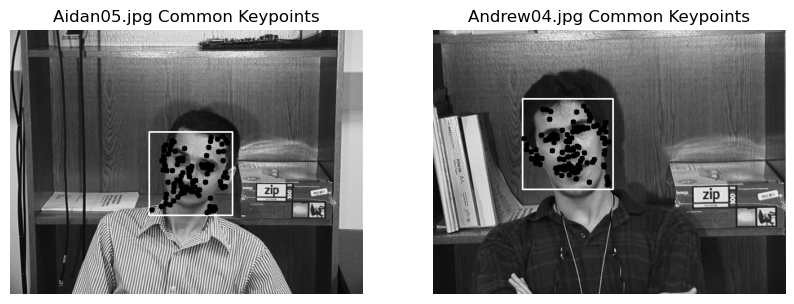

Comparison between Aidan05.jpg and Andrew04.jpg:
Average value of common keypoints: 1.0048985507246377
-----------------------------------------


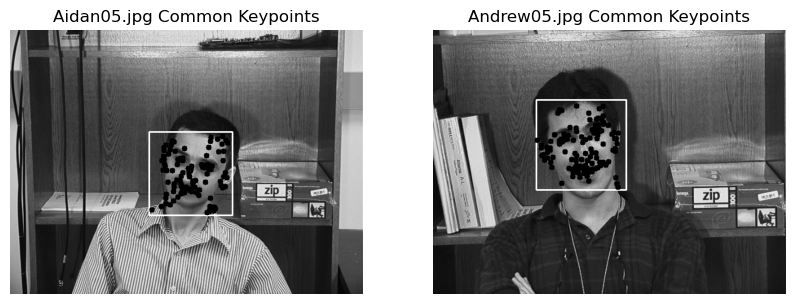

Comparison between Aidan05.jpg and Andrew05.jpg:
Average value of common keypoints: 1.0064285714285715
-----------------------------------------
Overall average value of common keypoints: 1.0353870045223323


In [5]:
### Testing ###


import cv2
import os
from matplotlib import pyplot as plt

# Load the pre-trained face detector
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

# Initialize SIFT
sift = cv2.SIFT_create()


# Path to the directory containing the training faces
image_dir = r"C:\Users\Ilan\Desktop\Face recognition\gt_db\gt_database 1\gt_database 1\gt_db\Aidan"


# Path to the directory containing the face of a person wishing to enter the system
image_dir2 = r"C:\Users\Ilan\Desktop\Face recognition\gt_db\gt_database 1\gt_database 1\gt_db\Andrew"



# Get a list of all image filenames in the directories
image_files = [file for file in os.listdir(image_dir) if file.endswith('.jpg')]
image_files2 = [file for file in os.listdir(image_dir2) if file.endswith('.jpg')]

# Initialize a list to store the average number of common keypoints for each pair of images
average_common_keypoints = []

# Iterate over each pair of images
for i in range(len(image_files)):
    for j in range(len(image_files2)):
        # The real face from training
        img1 = cv2.imread(os.path.join(image_dir, image_files[i]), cv2.IMREAD_GRAYSCALE)
        # The person wishing to enter
        img2 = cv2.imread(os.path.join(image_dir2, image_files2[j]), cv2.IMREAD_GRAYSCALE)
        
        # The real face from training
        faces1 = face_cascade.detectMultiScale(img1, scaleFactor=1.15, minNeighbors=5)
        # The person wishing to enter
        faces2 = face_cascade.detectMultiScale(img2, scaleFactor=1.15, minNeighbors=5)
        
        # Lists for common keypoints
        common_kp1 = []
        common_kp2 = []
        
        # Extract keypoints and descriptors only within the detected faces for real person
        for (x, y, w, h) in faces1:
            face_roi = img1[y:y+h, x:x+w]
            kp1, des1 = sift.detectAndCompute(face_roi, None)
            common_kp1.extend(kp1)
            cv2.rectangle(img1, (x, y), (x+w, y+h), (255, 0, 0), 2)
            for kp in common_kp1:
                cv2.circle(img1, (int(kp.pt[0]) + x, int(kp.pt[1]) + y), 5, (0, 255, 0), -1)
                
        # Extract keypoints and descriptors only within the detected faces for person wishing to enter
        for (x, y, w, h) in faces2:
            face_roi = img2[y:y+h, x:x+w]
            kp2, des2 = sift.detectAndCompute(face_roi, None)
            common_kp2.extend(kp2)
            cv2.rectangle(img2, (x, y), (x+w, y+h), (255, 0, 0), 2)
            for kp in common_kp2:
                cv2.circle(img2, (int(kp.pt[0]) + x, int(kp.pt[1]) + y), 5, (0, 255, 0), -1)
        
        # Calculate the average number of common keypoints for both lists, the real person, and the one wishing to enter
        if len(common_kp1) != 0 and len(common_kp2) != 0:
            average_keypoints = ((len(common_kp1) / len(common_kp2)) + (len(common_kp2) / len(common_kp1))) / 2
            average_common_keypoints.append(average_keypoints)
            
            
            
            # Display the images with detected faces and common keypoints
            fig, axes = plt.subplots(1, 2, figsize=(10, 5))
            axes[0].imshow(img1, cmap='gray')
            axes[0].set_title(f'{image_files[i]} Common Keypoints')
            axes[0].axis('off')
            
            axes[1].imshow(img2, cmap='gray')
            axes[1].set_title(f'{image_files2[j]} Common Keypoints')
            axes[1].axis('off')
            
            plt.show()
            
# Print the results of the comparison
            print(f"Comparison between {image_files[i]} and {image_files2[j]}:")
            print("Average value of common keypoints:", average_keypoints)
            print("-----------------------------------------")

# Check if there were any pairs with common keypoints
if average_common_keypoints:
    # Calculate the average value of each pair of pictures divided by the other
    average_value_test = sum(average_common_keypoints) / len(average_common_keypoints)
    print("Overall average value of common keypoints:", average_value_test)
else:
    print("No common keypoints found.")


At this stage we show the results

In [6]:
### Results ###
import re

# Using regular expression get only the names
name = re.sub(r'[^A-Za-z]+', '', image_files[i].replace(".jpg", ""))
print(f'{name}s value is: {average_value_real}.')
print(f'Our test results are: {average_value_test}.')

if average_value_test >= average_value_real:
    print("Access denied")
else:
    print("Access permitted")

Aidans value is: 1.0535247454464323.
Our test results are: 1.0353870045223323.
Access permitted


Examples of the results of the prgram.
Every itteration containes 15 images for each person and the result is 105 pairs.
(14 * 15) / 2 = 105 pairs.

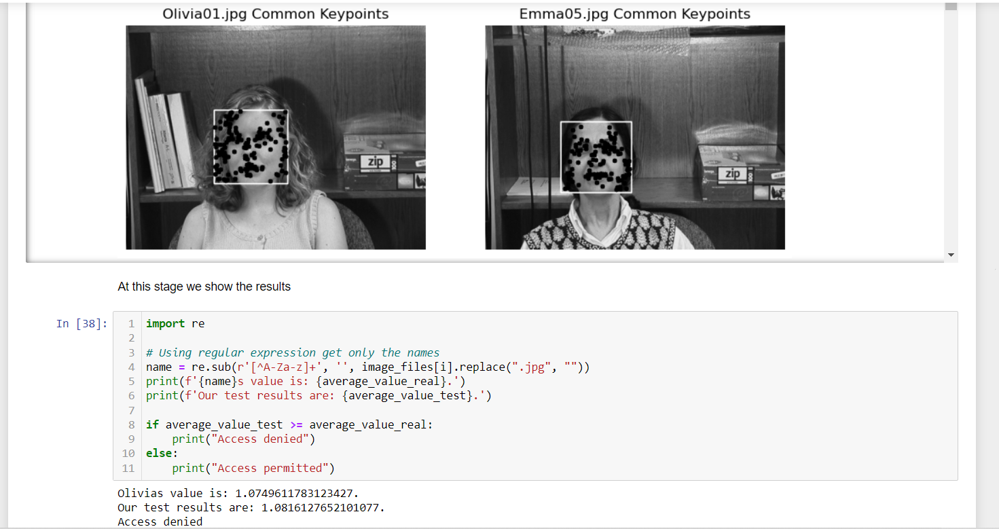

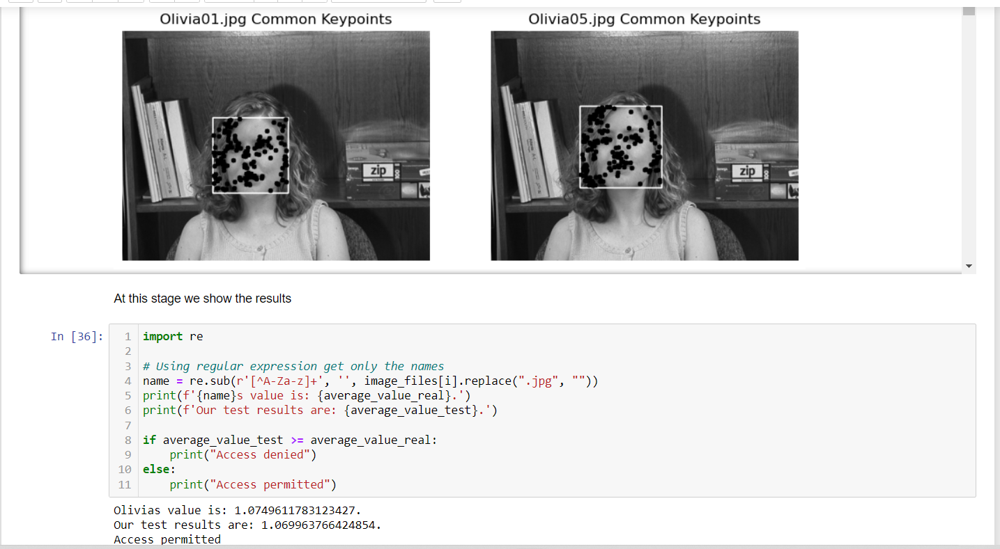

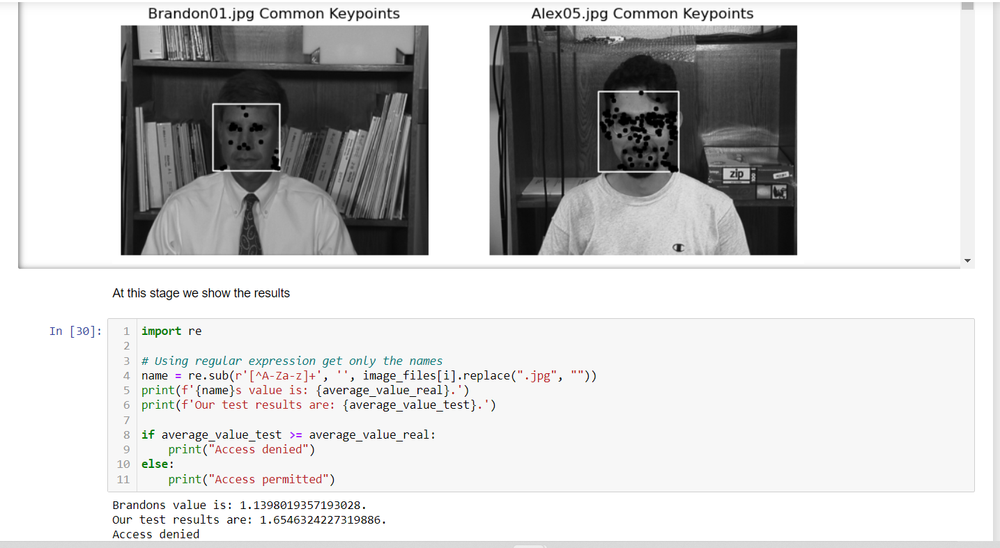

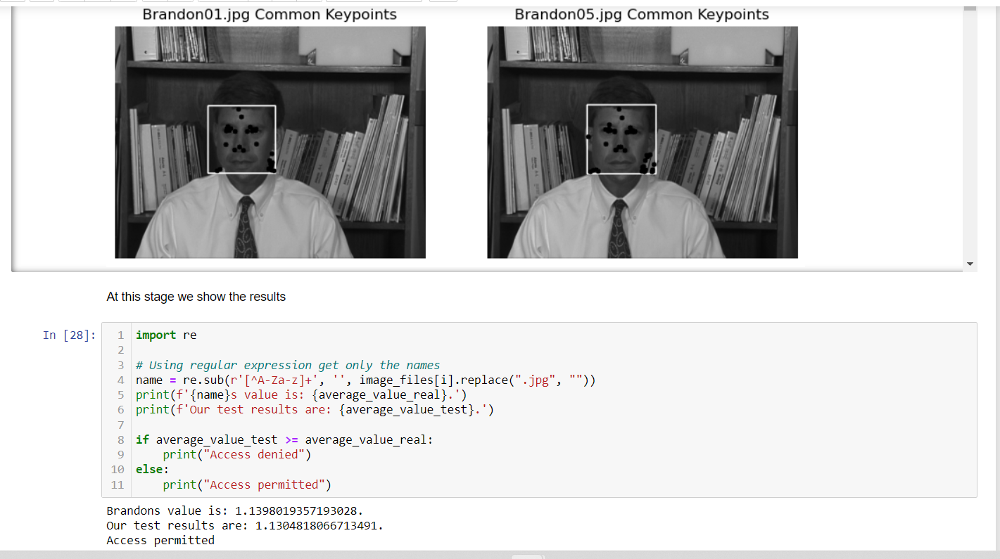

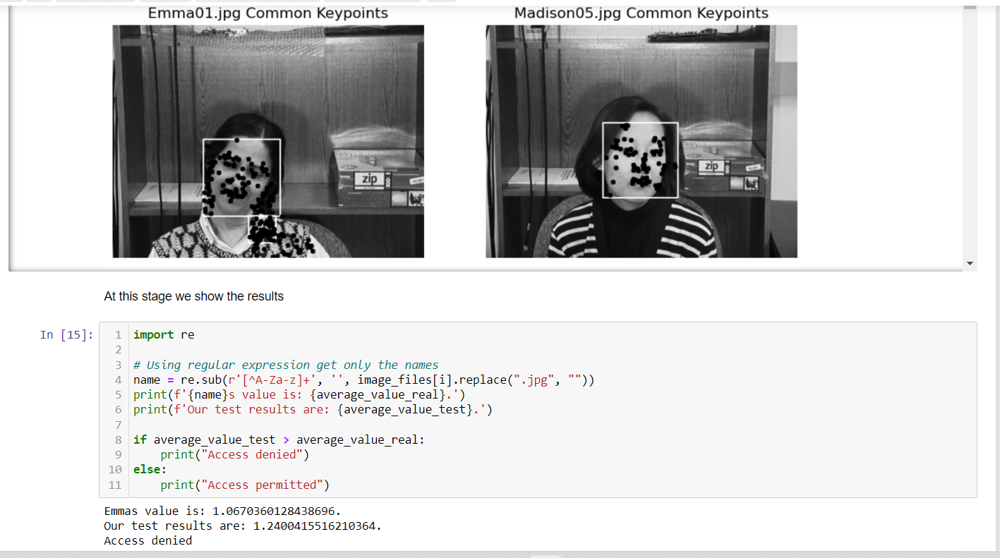

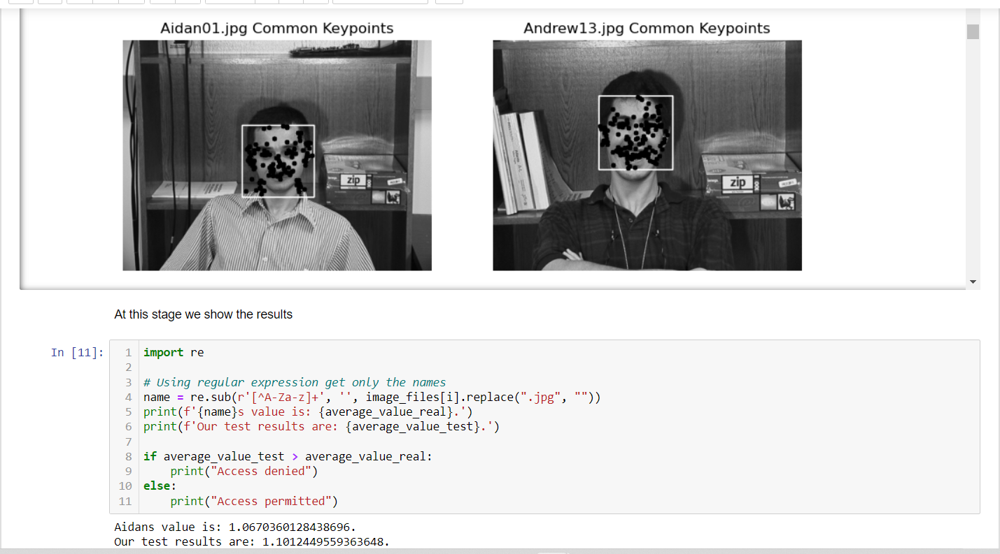

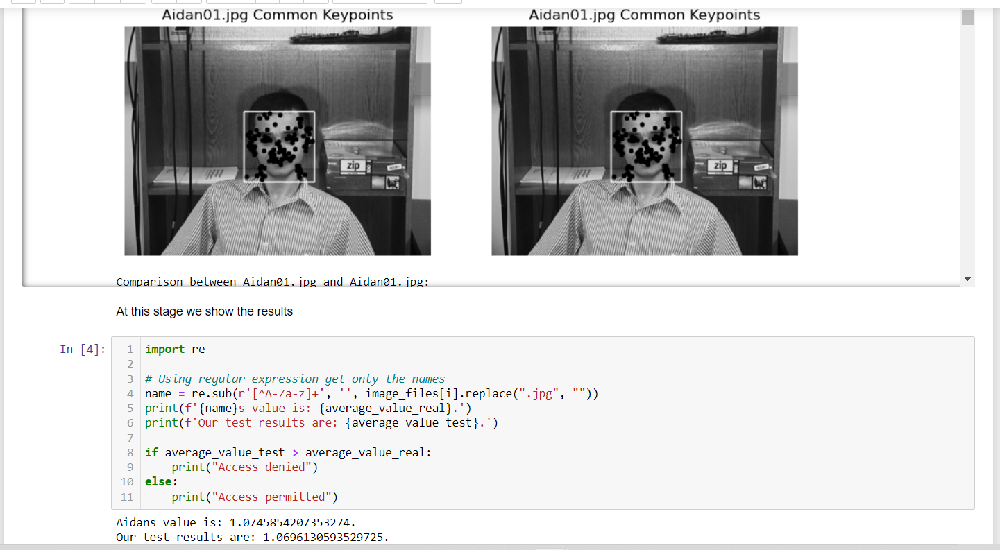

This is a second program that uses "dlib," a facial detector with pre-trained models. It is used to verify whether the person wishing to access is in the database or not.
Code source: The codes below is referred from: https://data-flair.training/blogs/python-face-recognition/


In [ ]:

!pip install numpy opencv-python
!pip install dlib
!pip install  

     
Requirement already satisfied: numpy in /usr/local/lib/python3.10/dist-packages (1.25.2)
Requirement already satisfied: opencv-python in /usr/local/lib/python3.10/dist-packages (4.8.0.76)
Requirement already satisfied: dlib in /usr/local/lib/python3.10/dist-packages (19.24.2)
Collecting face_recognition
  Downloading face_recognition-1.3.0-py2.py3-none-any.whl (15 kB)
Collecting face-recognition-models>=0.3.0 (from face_recognition)
  Downloading face_recognition_models-0.3.0.tar.gz (100.1 MB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100.1/100.1 MB 10.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
Requirement already satisfied: Click>=6.0 in /usr/local/lib/python3.10/dist-packages (from face_recognition) (8.1.7)
Requirement already satisfied: dlib>=19.7 in /usr/local/lib/python3.10/dist-packages (from face_recognition) (19.24.2)
Requirement already satisfied: numpy in /usr/local/lib/python3.10/dist-packages (from face_recognition) (1.25.2)
Requirement already satisfied: Pillow in /usr/local/lib/python3.10/dist-packages (from face_recognition) (9.4.0)
Building wheels for collected packages: face-recognition-models
  Building wheel for face-recognition-models (setup.py) ... done
  Created wheel for face-recognition-models: filename=face_recognition_models-0.3.0-py2.py3-none-any.whl size=100566170 sha256=3cf43b74d9e8edc38f42ce33ffad520ccbc02aa27a08c7409e07867affeeb5ee
  Stored in directory: /root/.cache/pip/wheels/7a/eb/cf/e9eced74122b679557f597bb7c8e4c739cfcac526db1fd523d
Successfully built face-recognition-models
Installing collected packages: face-recognition-models, face_recognition
Successfully installed face-recognition-models-0.3.0 face_recognition-1.3.0

# create folder for training and testing data
!mkdir train
!mkdir test
     

# Import the necessary libraries
import face_recognition as fr
import cv2

import numpy as np
import os
     

# Path to the directory with the trainig data
path = "./train/"

# Lists of the names of the people in database
known_names = []
known_name_encodings = []

# Retrieve a list of image files in the specified directory
images = os.listdir(path)
     

# A for loop for all relevent pictures
for _ in images:
  # Check if the item is a file (not a directory)
    if os.path.isfile(path + _):
      # Load the image using face_recognition library
        image = fr.load_image_file(path + _)
        image_path = path + _

        # Using th mduel "face_recognition" to encode the the rlevant images 
        encoding = fr.face_encodings(image)[0]

        # Append the encoding and corresponding name to the lists
        known_name_encodings.append(encoding)
        known_names.append(os.path.splitext(os.path.basename(image_path))[0].capitalize())

# Print the list of known names from the database
print(known_names)
     
['Andrew04', 'Emma14', 'Emma02', 'Aidan07', 'Andrew06', 'Emma03', 'Aidan06', 'Aidan02', 'Aidan04', 'Aidan13', 'Andrew07', 'Aidan01', 'Emma11', 'Emma05', 'Aidan11', 'Emma15', 'Andrew13', 'Emma04', 'Andrew08', 'Andrew03', 'Emma07', 'Aidan15', 'Emma08', 'Andrew14', 'Aidan10', 'Aidan09', 'Aidan03', 'Andrew10', 'Emma10', 'Andrew01', 'Emma13', 'Emma09', 'Andrew15', 'Andrew11', 'Andrew12', 'Aidan08', 'Andrew02', 'Aidan12', 'Aidan14', 'Andrew05', 'Emma01']

# Path to the test image
test_image = "./test/test1.jpg"
# Load the image using OpenCV
image = cv2.imread(test_image)

# image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
     

# Detect face locations and encodings in the test image
face_locations = fr.face_locations(image)
face_encodings = fr.face_encodings(image, face_locations)

     

# below code cell is only be used in google colab as it is having patching problems with cv imshow
from google.colab.patches import cv2_imshow # (ignore it if using jypter notebook)

# Define a default name for unrecognized faces
default_name = "Unknown"

# Loop through each detected face and compare it with known encodings
for (top, right, bottom, left), face_encoding in zip(face_locations, face_encodings):
    matches = fr.compare_faces(known_name_encodings, face_encoding)
    name = ""

    # Calculate face distances to find the best match
    face_distances = fr.face_distance(known_name_encodings, face_encoding)
    best_match = np.argmin(face_distances)

   # If a match is found, assign the name associated with the best match
    if matches[best_match]:
        name = known_names[best_match]

   # Draw rectangles around the detected faces and display the name
    cv2.rectangle(image, (left, top), (right, bottom), (0, 0, 255), 2)
    cv2.rectangle(image, (left, bottom - 15), (right, bottom), (0, 0, 255), cv2.FILLED)
    font = cv2.FONT_HERSHEY_DUPLEX
    cv2.putText(image, name, (left + 6, bottom - 6), font, 1.0, (255, 255, 255), 1)

  # Display the annotated image
    cv2_imshow(image)

# Save the annotated image
cv2.imwrite("./output.jpg", image)

# Wait for a key press and close all OpenCV windows
cv2.waitKey(0)
cv2.destroyAllWindows()

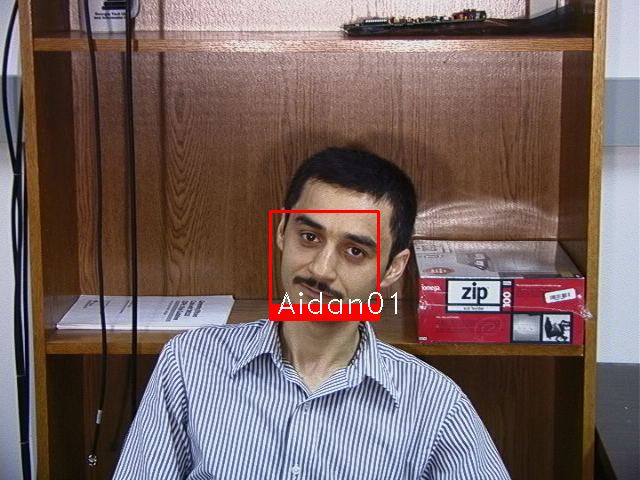

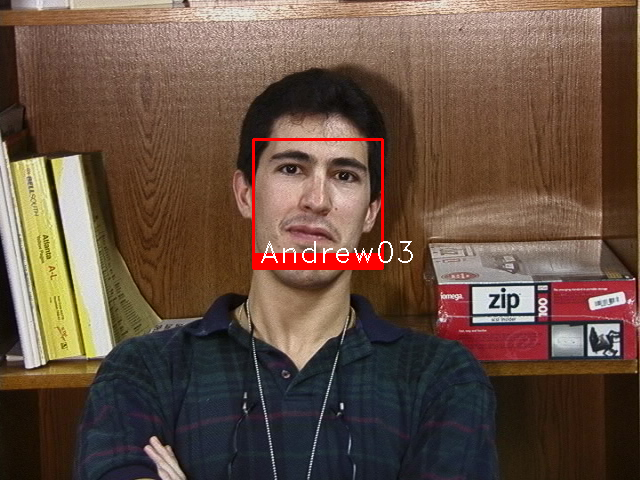

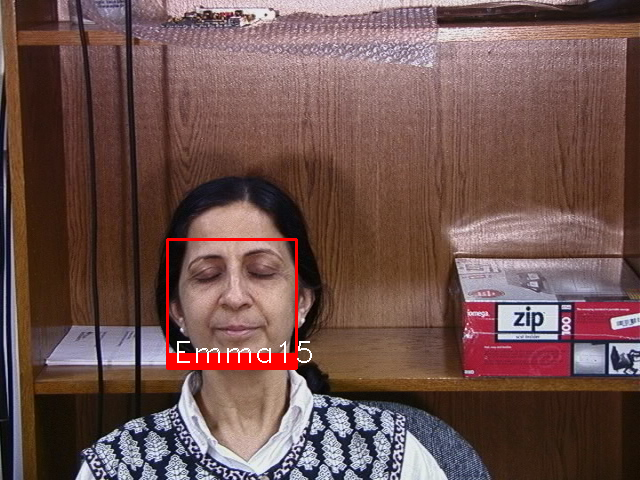

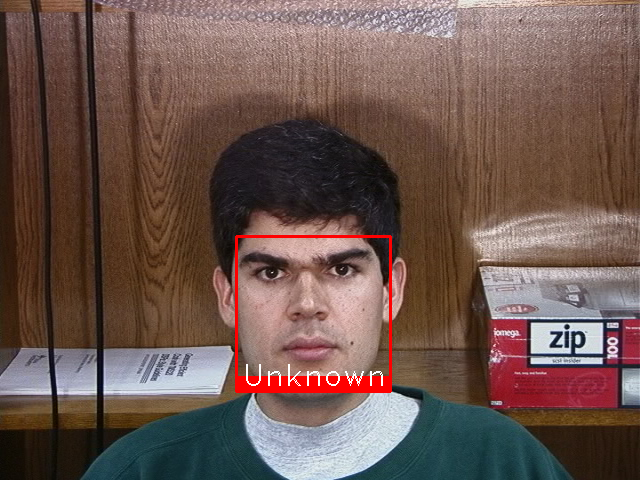